## **Title: Bank Churn Kaggle Competition**

- `Author:` Maria Nadeem

- `Linkdin Account:` [Linkdin](https://www.linkedin.com/in/maria-nadeem-4994122aa/)

- `Email:`[Email](marianadeem755@gmail.com)

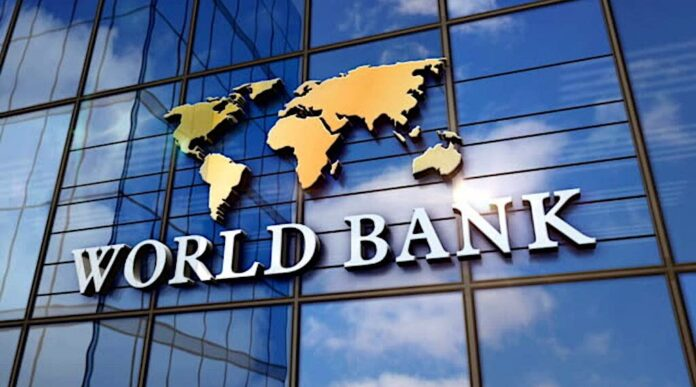

## **Table of contents**
[Step-1|Import Libararies](#Step-1)\
[Title](#Title)\
[Step-2| Load the Training, Testing and Submission Data](#Step-2)\
[Step-3| Lets Explore the Training Data (df_train.csv)](#Step-3)\
[Step-4| Training Data (df_train) Structure](#Step-4)\
[Step-5| Summary Statistics](#Step-5)\
[Step-6| Training Data (df_train) shape](#Step-6)\
[Step-7| Lets check df_train columns](#Step-7)\
[Exploratory Data Analysis](#eda)\
[Step-8| Missing values](#Step-8)\
[Step-9| Lets Explore Each Column of Training Data (df_train)](#Step-9)\
[Step-9.1| Lets Explore the id column](#Step-9.1)\
[Step-9.2| Lets explore the CustomerId column](#Step-9.2)\
[Step-9.3| Lets explore the Surnames column](#Step-9.3)\
[Step-9.4| Lets explore the CreditScore column](#Step-9.4)\
[Step-9.5| Lets explore the Geography column](#Step-9.5)\
[Step-9.6| Lets Explore the sex column](#Step-9.6)\
[Step-9.7| Lets Explore the Age column](#Step-9.7)\
[Step-9.7.1| Feature Engineering and create the binned_Age column](#Step-9.7.1)\
[Step-9.8| Lets Explore the Tenure column](#Step-9.8)\
[Step-9.9| Lets Explore the Balance column](#Step-9.9)\
[Step-9.10| Lets Explore the NumOfProducts column](#Step-9.10)\
[Step-9.11| Lets Explore the HasCrCard column](#Step-9.11)\
[Step-9.12| Lets Explore the IsActiveMember column](#Step-9.12)\
[Step-9.13| Lets Explore the EstimatedSalary Column](#Step-9.13)\
[Step-14| Deep Learning (Neural Network)](#Step-14)\
[Step-15| XGBClassifier](#Step-15)\
[Step-16| Creating Submission File](#Step-16)\
[Step-17| HyperparameterTuning of XGBClassifier](#Step-17)\
[Step-18| Creating Submission File](#Step-18)

### **Step-1|Import Libararies** <a id="Step-1"></a>

In [1]:
# Import Libararies
import pandas as pd 
import numpy as np 
import seaborn as sns 
import matplotlib.pyplot as plt 
import plotly.express as px
# Import Standaradscalar, MinMaxScaler, LabelEncoder
from sklearn.preprocessing import StandardScaler, MinMaxScaler, LabelEncoder
#import iterative imputer
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
# Import train test split
from sklearn.model_selection import train_test_split
# for Mchine learning
#For Regression
from sklearn.linear_model import LinearRegression
from sklearn.tree import DecisionTreeRegressor
from sklearn.ensemble import RandomForestRegressor,AdaBoostRegressor,GradientBoostingRegressor
from sklearn.neighbors import KNeighborsClassifier
from xgboost import XGBRegressor
from sklearn.naive_bayes import GaussianNB
#For classification
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier,AdaBoostClassifier,GradientBoostingClassifier
from sklearn.svm import SVC
from xgboost import XGBClassifier
from sklearn.naive_bayes import GaussianNB
# import pipeline
from sklearn.pipeline import Pipeline
# import cross validation score
from sklearn.model_selection import cross_val_score
# import Metrics
from sklearn.metrics import mean_squared_error, r2_score, mean_absolute_error
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix, classification_report
# Import Deep Learning Libararies
import tensorflow as tf 
from tensorflow import keras
from tensorflow.keras import layers
# import Earlystopping
from tensorflow.keras.callbacks import EarlyStopping
# Remove Warnings
import warnings
warnings.filterwarnings("ignore")

### `Title| Exited Rate Determined by the Neural Network in TensorFlow and by XGBoostClassifier`<a id="Title"></a>

### **Step-2| Load the Training, Testing and Submission Data** <a id="Step-2"></a>

In [2]:
# Load the Training Dataset
df_train=pd.read_csv('/kaggle/input/playground-series-s4e1/train.csv')
# Load the Testing Dataset
df_test=pd.read_csv('/kaggle/input/playground-series-s4e1/test.csv')
# Load the Submission
submission=pd.read_csv('/kaggle/input/playground-series-s4e1/sample_submission.csv')

In [3]:
# Lets check the First Five Rows of Training Data
df_train.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0


In [4]:
# Lets check the First Five Rows of Testing Data
df_test.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary
0,165034,15773898,Lucchese,586,France,Female,23.0,2,0.00,2,0.0,1.0,160976.75
1,165035,15782418,Nott,683,France,Female,46.0,2,0.00,1,1.0,0.0,72549.27
2,165036,15807120,K?,656,France,Female,34.0,7,0.00,2,1.0,0.0,138882.09
3,165037,15808905,O'Donnell,681,France,Male,36.0,8,0.00,1,1.0,0.0,113931.57
4,165038,15607314,Higgins,752,Germany,Male,38.0,10,121263.62,1,1.0,0.0,139431.00


In [5]:
# Lets check the First Five Rows of Submission 
submission.head()

,id,Exited
0,165034,0.5
1,165035,0.5
2,165036,0.5
3,165037,0.5
4,165038,0.5


## **Step-3| Lets Explore the Training Data (df_train.csv)** <a id="Step-3"></a>

#### `Training Data(df_train) Discription:`
* `id:` A unique identifier.
* `CustomerId:` A unique identifier for each customer.
* `Surname:` The surname of the customer.
* `CreditScore:` The credit score of the customer.
* `Geography:` The country where the customer resides.
* `Gender:` The gender of the customer.
* `Age:` The age of the customer.
* `Tenure:` The number of years the customer has been with the bank.
* `Balance:` The account balance of the customer.
* `NumOfProducts:`The number of bank products the customer uses (e.g., savings account, credit card)
* `IsActiveMember:` Whether the customer is an active member or not.
* `EstimatedSalary:` The estimated salary of the customer.
* `Exited:` Whether the customer has churned or not (Target Variable)

### **Aims and Objectives:**
>* `The Main Aim is to classify the Customers who will stay in the bank or leave the bank using Deep Learning Approach(Neural Network)`
>* Firstly I undergoes Exploratory Data Analysis( For Taking Insights about each column)
>* Then Train the Model using Deep Neural Network to predict whether a customer churn in the bank or not

#### `python Version Used: 3.8.18`

### **Step-4| Training Data (df_train) Structure** <a id="Step-4"></a>

In [6]:
# Data Structure
df_train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 165034 entries, 0 to 165033
Data columns (total 14 columns):
 #   Column           Non-Null Count   Dtype  
---  ------           --------------   -----  
 0   id               165034 non-null  int64  
 1   CustomerId       165034 non-null  int64  
 2   Surname          165034 non-null  object 
 3   CreditScore      165034 non-null  int64  
 4   Geography        165034 non-null  object 
 5   Gender           165034 non-null  object 
 6   Age              165034 non-null  float64
 7   Tenure           165034 non-null  int64  
 8   Balance          165034 non-null  float64
 9   NumOfProducts    165034 non-null  int64  
 10  HasCrCard        165034 non-null  float64
 11  IsActiveMember   165034 non-null  float64
 12  EstimatedSalary  165034 non-null  float64
 13  Exited           165034 non-null  int64  
dtypes: float64(5), int64(6), object(3)
memory usage: 17.6+ MB


In [7]:
df_train.dtypes

id                   int64
CustomerId           int64
Surname             object
CreditScore          int64
Geography           object
Gender              object
Age                float64
Tenure               int64
Balance            float64
NumOfProducts        int64
HasCrCard          float64
IsActiveMember     float64
EstimatedSalary    float64
Exited               int64
dtype: object

### **Step-5| Summary Statistics** <a id="Step-5"></a>

In [8]:
# Summary Statistics
df_train.describe()

,id,CustomerId,CreditScore,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited
count,165034.0000,1.650340e+05,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000,165034.000000
mean,82516.5000,1.569201e+07,656.454373,38.125888,5.020353,55478.086689,1.554455,0.753954,0.497770,112574.822734,0.211599
std,47641.3565,7.139782e+04,80.103340,8.867205,2.806159,62817.663278,0.547154,0.430707,0.499997,50292.865585,0.408443
min,0.0000,1.556570e+07,350.000000,18.000000,0.000000,0.000000,1.000000,0.000000,0.000000,11.580000,0.000000
25%,41258.2500,1.563314e+07,597.000000,32.000000,3.000000,0.000000,1.000000,1.000000,0.000000,74637.570000,0.000000
50%,82516.5000,1.569017e+07,659.000000,37.000000,5.000000,0.000000,2.000000,1.000000,0.000000,117948.000000,0.000000
75%,123774.7500,1.575682e+07,710.000000,42.000000,7.000000,119939.517500,2.000000,1.000000,1.000000,155152.467500,0.000000
max,165033.0000,1.581569e+07,850.000000,92.000000,10.000000,250898.090000,4.000000,1.000000,1.000000,199992.480000,1.000000


In [9]:
# Display Maximum Rows and columns
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)

### **Step-6| Training Data (df_train) shape** <a id="Step-6"></a>

In [10]:
# Training Data (df_train) shape
df_train.shape

(165034, 14)

### `Observations:`
>* The Training Data df_train consists of 165034 Rows and 14 Columns.
>* In it 6 columns are of int datatype such as id ,CustomerId, CreditScore, Tenure, NumOfProducts, Exited. 
>* In it 5 column are of float dtype such as Age, Balance, HasCrCard, IsActiveMember, EstimatedSalary.
>* In it 3 columns are of object datatype such as Surname, Geography, Gender

### **Step-7| Lets check df_train columns**<a id="Step-7"></a>

In [11]:
# Lets check df_train columns
df_train.columns

Index(['id', 'CustomerId', 'Surname', 'CreditScore', 'Geography', 'Gender',
       'Age', 'Tenure', 'Balance', 'NumOfProducts', 'HasCrCard',
       'IsActiveMember', 'EstimatedSalary', 'Exited'],
      dtype='object')

<a id="eda"></a>
<span style="font-weight: bold; color: Red; font-size: 35px;">Step-8| Exploratory Data Analysis</span>

<span style="font-weight: bold; color: Red; font-size: 35px;">Step-8| Missing values</span>

In [12]:
# Lets check the Missing values of df_train
df_train.isnull().sum().sort_values(ascending=True)

id                 0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
dtype: int64

<Axes: >

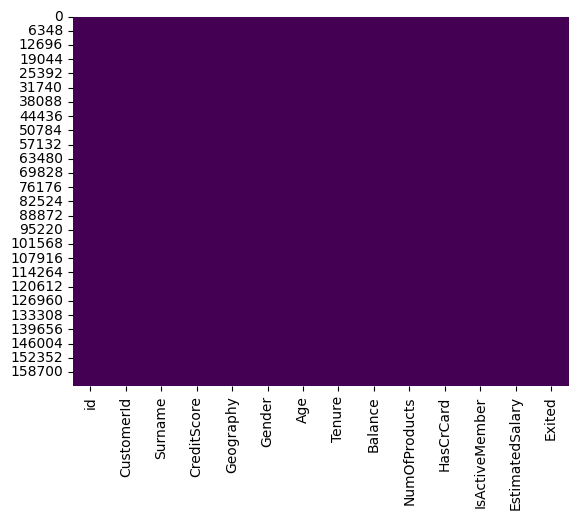

In [13]:
# Lets check by Missing/Null values by plotting
sns.heatmap(df_train.isnull(), cmap='viridis', cbar=False)


### **Observations:**
>* There is no Missing value present in df_train.

In [14]:
df_train.duplicated().any()

False

### **Step-9| Lets Explore Each Column of Training Data (df_train)** <a id="Step-9"></a>

#### **Step-9.1| Lets Explore the id column** <a id="Step-9.1"></a>

In [15]:
df_train['id'].min(), df_train['id'].max()
print('The maximum id value present in Training Data is:', df_train['id'].max())
print('The Minimum id value present in the Training Data is:',df_train['id'].min())

The maximum id value present in Training Data is: 165033
The Minimum id value present in the Training Data is: 0


### `Observation:`
>* The maximum id value present in Training Data is: 165033
>* The Minimum id value present in the Training Data is: 0

### **Step-9.2| Lets explore the CustomerId column** <a id="Step-9.2"></a>

In [16]:
df_train['CustomerId'].describe()

count    1.650340e+05
mean     1.569201e+07
std      7.139782e+04
min      1.556570e+07
25%      1.563314e+07
50%      1.569017e+07
75%      1.575682e+07
max      1.581569e+07
Name: CustomerId, dtype: float64

In [17]:
# print the Mean, Median, Mode column of CustomerId
# print the mode of CustomerId column
print('The mode of CustomerId column:', df_train['CustomerId'].mode()[0])
# print the mean of CustomerId column
print('The Mean of CustomerId column:', df_train['CustomerId'].mean())
# print the median of CustomerId column
print('The Median of CustomerId column is:', df_train['CustomerId'].median())

The mode of CustomerId column: 15682355
The Mean of CustomerId column: 15692005.019026382
The Median of CustomerId column is: 15690169.0


In [18]:

df_train.groupby('Gender')['CustomerId'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,1.569216e+07,71258.047192,15565701.0,15633612.0,15690647.0,15756668.5,15815690.0
Male,93150.0,1.569188e+07,71505.634060,15565701.0,15632850.0,15689955.0,15756850.0,15815690.0


In [19]:
fig=px.histogram(df_train['CustomerId'], color=df_train['Gender'])
fig.show()

### `Observations:`
>* The mode of CustomerId column: 15682355
>* The Mean of CustomerId column: 15692005.019026382
>* The Median of CustomerId column is: 15690169.0
>* The Maximum Customer id of Male in df_train is 15815690.0
>* The Maximum Customer id of Femmale in df_train is 15815690.0
>* The Minimum Customer id of Male in df_train is 15565701.0
>* The Minimum Customer id of Female in df_train is 15565701.0

### **Step-9.3| Lets explore the Surnames column** <a id="Step-9.3"></a>

In [20]:

# Display all unique surnames
unique_surnames = df_train['Surname'].unique()
print('The unique values of Surname column is:',unique_surnames)
print('The Total unique values of Surname column is:', df_train['Surname'].nunique())

The unique values of Surname column is: ['Okwudilichukwu' 'Okwudiliolisa' 'Hsueh' ... 'Aliyev' 'McMinn' 'Elkins']
The Total unique values of Surname column is: 2797


In [21]:
grouped_data=df_train.groupby('Gender')['Surname'].describe()
grouped_data

,count,unique,top,freq
Gender,,,,
Female,71884,2474,Hsia,1029
Male,93150,2556,Hsia,1427


In [22]:
fig = px.bar(grouped_data, x=grouped_data.index, y='count')
fig.show()


### `Observations:`
>* The Total unique values of Surname column is: 2797.
>* The Top Surname based on Gender is Hsia.
>* The count of Surname column based on the Gender(Male) is 93.15k.
>* The count of Surname column based on the Gender(Female) is 71.884k.

### **Step-9.4| Lets explore the CreditScore column** <a id="Step-9.4"></a>

In [23]:
df_train['CreditScore'].describe()

count    165034.000000
mean        656.454373
std          80.103340
min         350.000000
25%         597.000000
50%         659.000000
75%         710.000000
max         850.000000
Name: CreditScore, dtype: float64

In [24]:
grouped_data1=df_train.groupby('Gender')['CreditScore'].describe()
grouped_data1

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,656.243726,80.502500,350.0,597.0,659.0,710.0,850.0
Male,93150.0,656.616930,79.793996,350.0,598.0,660.0,710.0,850.0


In [25]:
fig = px.histogram(df_train['CreditScore'], color=df_train['Gender'])
fig.show()

### `Observations:`
>* The Maximum Creditscore based on Gender (Male and Female) is 850-851.
>* The Minimum Creditscore based on Gender (Male and Female) is 350-351.
>* The Creditscore count of Female is 71884.0.
>* The Creditscore count of Male is 93150.0

### **Step-9.5| Lets explore the Geography column** <a id="Step-9.5"></a>

In [26]:
df_train['Geography'].value_counts()

Geography
France     94215
Spain      36213
Germany    34606
Name: count, dtype: int64

In [27]:
# Group the df_train by 'Geography' and calculate the sum of the columns
sum_df = df_train.groupby('Geography').sum().reset_index()

# Create a choropleth map using Plotly Express
fig = px.choropleth(sum_df, locations='Geography', locationmode='country names',
                    color='CreditScore', hover_name='Geography',
                    title='Sum of CreditScore by Geography')

# Display the map
fig.show()

### `Observations:`
>* The valuecounts of France is 94215
>* The valuecounts of Spain is 36213
>* The valuecounts of Germany is 34606
>* The Creditscore of the people of France is 61.81075M
>* The Creditscore of the people of Spain is 23.79316M
>* The Creditscore of the people of Germany is 22.73338M


### **Step-9.6| Lets Explore the sex column** <a id="Step-9.6"></a>

In [28]:
df_train['Gender'].value_counts()

Gender
Male      93150
Female    71884
Name: count, dtype: int64

<Axes: xlabel='Gender', ylabel='Count'>

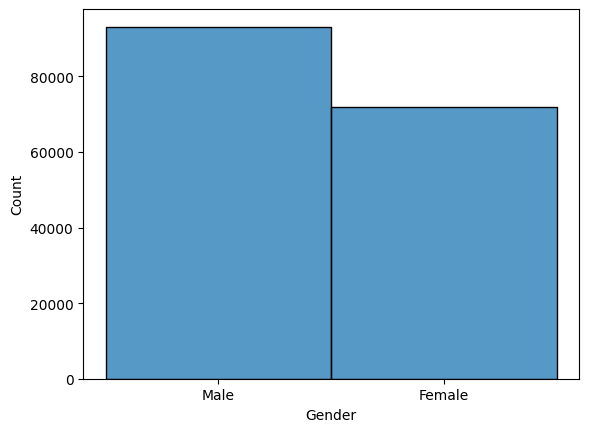

In [29]:
sns.histplot(df_train['Gender'])

In [30]:
# Calculate the percentage of male and female by first calculating the male and female count
male_count=93150
Female_count=71884
total_count=male_count-Female_count
# Calculate the percentage of male and Female
percentage_male = (male_count / total_count) * 100
percentage_Female = (Female_count / total_count) * 100
# Display the Male and Female percentages present in the Dataset
print(f"The percentage of male is: {percentage_male:.2f}%")
print(f"The percentage of Female is: {percentage_Female:.2f}%")
# Calculate the Difference 
Difference_percentage=(male_count-Female_count)/(Female_count)*100
# Print the Difference in percentage of Male and Female
print(f"percentage_male is {Difference_percentage: .2f}% more than female_percentage")

The percentage of male is: 438.02%
The percentage of Female is: 338.02%
percentage_male is  29.58% more than female_percentage


### `Observations:`
>* The Male in df_train is 93150
>* The Female in df_train is 71884
>* The percentage of male is: 438.02%
>* The percentage of Female is: 338.02%
>* percentage_male is  29.58% more than female_percentage

### **Step-9.7| Lets Explore the Age column** <a id="Step-9.7"></a>

In [31]:
# Summary statistics of Age column
df_train['Age'].describe()

count    165034.000000
mean         38.125888
std           8.867205
min          18.000000
25%          32.000000
50%          37.000000
75%          42.000000
max          92.000000
Name: Age, dtype: float64

In [32]:
# Summary Statistics of Age column based on sex
df_train.groupby('Gender')['Age'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,38.763207,9.124936,18.0,33.0,38.0,44.0,92.0
Male,93150.0,37.634068,8.631011,18.0,32.0,37.0,41.0,92.0


In [33]:
fig=px.histogram(df_train['Age'], color=df_train['Gender'])
fig.show()

### **Step-9.7.1| Feature Engineering and create the binned_Age column** <a id="Step-9.7.1"></a>

In [34]:
bins=[18, 40, 60, 75, 90]
labels=['Adult', 'Middle_aged', 'older', 'oldest']
df_train['binned_Age']=pd.cut(df_train['Age'], bins=bins, labels=labels)
df_train.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,binned_Age
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0,Adult
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0,Adult
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0,Adult
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0,Adult
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0,Adult


In [35]:
# Lets check the binned_Age percentage
print('The binned_Age column percentage is:',df_train['binned_Age'].isnull().sum()/len(df_train)*100)
# Lets impute the missing values of binned_Age
df_train['binned_Age'].fillna(df_train['binned_Age'].mode()[0], inplace=True)

The binned_Age column percentage is: 0.0781657113079729


In [36]:
df_train.isnull().sum()

id                 0
CustomerId         0
Surname            0
CreditScore        0
Geography          0
Gender             0
Age                0
Tenure             0
Balance            0
NumOfProducts      0
HasCrCard          0
IsActiveMember     0
EstimatedSalary    0
Exited             0
binned_Age         0
dtype: int64

### `Observations:`
>* The Minimum Age of people in df_train is 18.000000
>* The Maximum Age of people in df_train is 92.000000
>* The count of Female is 71884.0
>* The count of Male is 93150.0
>* After taking Insights of Age column then I created the bins of age column 
>* Then I imputed the Missing Values present in the binned_Age column using mode as the percentage of missing values in binned_Age column is 0.07%

### **Step-9.8| Lets Explore the Tenure column** <a id="Step-9.8"></a>

In [37]:
# Sumary statistics of Tenure column
df_train['Tenure'].describe()

count    165034.000000
mean          5.020353
std           2.806159
min           0.000000
25%           3.000000
50%           5.000000
75%           7.000000
max          10.000000
Name: Tenure, dtype: float64

In [38]:
# Lets check the Tenure based on sex of df_train data
df_train.groupby('Gender')['Tenure'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,4.992349,2.811852,0.0,3.0,5.0,7.0,10.0
Male,93150.0,5.041965,2.801581,0.0,3.0,5.0,7.0,10.0


In [39]:
fig=px.histogram(df_train['Tenure'], color=df_train['Gender'])
fig.show()

### `Observations:`
>* The Female count of df_train is 71884.0
>* The Male count of df_train is 93150.0
>* The Maximum Tenure of Male and Female is 10 Years

### **Step-9.9| Lets Explore the Balance column** <a id="Step-9.9"></a>

In [40]:
# Summary Statistics of Gender column
df_train['Balance'].describe()

count    165034.000000
mean      55478.086689
std       62817.663278
min           0.000000
25%           0.000000
50%           0.000000
75%      119939.517500
max      250898.090000
Name: Balance, dtype: float64

In [41]:
# Lets check the Balance base on Gender
fig=px.histogram(df_train['Age'], color=df_train['Gender'])
fig.show()


### `Observations:`
>* The Maximum Balance of people in df_train is 250898.090000
>* The Mean Balance of people in df_train is 55478.086689 

### **Step-9.10| Lets Explore the NumOfProducts column** <a id="Step-9.10"></a>

In [42]:
df_train['NumOfProducts'].describe()

count    165034.000000
mean          1.554455
std           0.547154
min           1.000000
25%           1.000000
50%           2.000000
75%           2.000000
max           4.000000
Name: NumOfProducts, dtype: float64

In [43]:
# Lets plot the Histogram of NumOfProducts
fig=px.histogram(df_train, x='Geography', color='NumOfProducts')
fig.show()

### `Observations:`
>* The Maximum NoOfProducts in df_train is 4.000000
>* The Minimum NoOfProducts in df_train is 1.000000

### **Step-9.11| Lets Explore the HasCrCard column** <a id="Step-9.11"></a>

`HasCrCard column` usually contains two values:
>* `"1"` to indicate that the customer has a credit card 
>* `"0"` to indicate that the customer does not have a credit card.

In [44]:
df_train['HasCrCard'].value_counts()

HasCrCard
1.0    124428
0.0     40606
Name: count, dtype: int64

In [45]:
fig=px.histogram(df_train['HasCrCard'], color=df_train['Geography'])
fig.show()

### `Observations:`
>* In df_train 124428 people have HasCrCard
>* 40606 people donot have HasCrCard
>* 8659 people in Germany donot have HasCrCard in according to df_train
>* 9323 people in spain donot have HasCrCard in according to df_train
>* 22.624k people in France donot have HasCrCard in according to df_train
>* 25.947k people in Germany have HasCrCard in according to df_train
>* 26.89k people in span have HasCrCard in according to df_train
>* 71.59k people in span have France in according to df_train

### **Step-9.12| Lets Explore the IsActiveMember column** <a id="Step-9.12"></a>

The `"IsActiveMember"` column usually contains two values: 
>* `"1"` to indicate that the customer is an active member .
>* `"0"` to indicate that the customer is not an active member.

In [46]:
# Lets Explore the IsActiveMember column
df_train['IsActiveMember'].value_counts()

IsActiveMember
0.0    82885
1.0    82149
Name: count, dtype: int64

In [47]:
fig=px.histogram(df_train['IsActiveMember'], color=df_train['Geography'])
fig.show()

### `Observations:`
>* 82885 people donot IsActiveMember
>* 82149 people are IsActiveMember
>* 16.002k people are IsActiveMember in Germany
>* 18.52k people are IsActiveMember in Span
>* 47.626 people are IsActiveMember in France
>* 18.604k people donot IsActiveMember in Germany
>* 17.693k people donot IsActiveMember in Span
>* 46.588k people donot IsActiveMember in France

### **Step-9.13| Lets Explore the EstimatedSalary Column** <a id="Step-9.13"></a>

In [48]:
df_train['EstimatedSalary'].describe()

count    165034.000000
mean     112574.822734
std       50292.865585
min          11.580000
25%       74637.570000
50%      117948.000000
75%      155152.467500
max      199992.480000
Name: EstimatedSalary, dtype: float64

In [49]:
# Lets calculate the Estimatedsalary based on Gender
df_train.groupby('Gender')['EstimatedSalary'].describe()

,count,mean,std,min,25%,50%,75%,max
Gender,,,,,,,,
Female,71884.0,113020.123777,50552.841179,11.58,74800.99,118974.85,156439.560,199992.48
Male,93150.0,112231.183226,50088.885067,11.58,74588.41,117122.50,153829.455,199992.48


In [50]:
fig=px.histogram(df_train['EstimatedSalary'], color=df_train['Gender'])
fig.show()

### `Observation:`
>* The Maximum Estimated salary of Male and Female is 199992.48k
>* The Minimum Estimatedsalary of Male and Female is 11.58k

### **Step-9.14| Lets Explore the Exited Column** <a id="Step-9.14"></a>

The `Exited column` consists of Two values .It is Binary Variable 
>* It represents whether customer has exited or is still an active customer.
>* `"0"` represents the customer has exited
>* `"1"` represents the customer has not exited or is still an active customer

In [51]:
df_train['Exited'].value_counts()

Exited
0    130113
1     34921
Name: count, dtype: int64

In [52]:
df_train.groupby('Gender')['Exited'].value_counts()

Gender  Exited
Female  0         51779
        1         20105
Male    0         78334
        1         14816
Name: count, dtype: int64

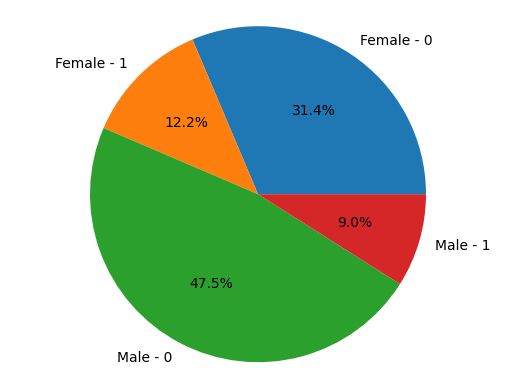

In [53]:
grouped_data = df_train.groupby('Gender')['Exited'].value_counts()

labels = []
values = []

for key, value in grouped_data.items():
    gender, exited = key
    labels.append(f"{gender} - {exited}")
    values.append(value)

import matplotlib.pyplot as plt

plt.pie(values, labels=labels, autopct='%1.1f%%')
plt.axis('equal')
plt.show()

In [54]:
fig=px.histogram(df_train['Exited'], color=df_train['Gender'])
fig.show()

### `Observations:`
>* 51779 Female donot Exited or is still active member
>* 20105 Female have been Exited
>* 78334 Male donot Exited or is still active member
>* 14816 Male have been Exited

In [55]:
# Copy df_train to df
df=df_train.copy()

In [56]:
df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,binned_Age
0,0,15674932,Okwudilichukwu,668,France,Male,33.0,3,0.00,2,1.0,0.0,181449.97,0,Adult
1,1,15749177,Okwudiliolisa,627,France,Male,33.0,1,0.00,2,1.0,1.0,49503.50,0,Adult
2,2,15694510,Hsueh,678,France,Male,40.0,10,0.00,2,1.0,0.0,184866.69,0,Adult
3,3,15741417,Kao,581,France,Male,34.0,2,148882.54,1,1.0,1.0,84560.88,0,Adult
4,4,15766172,Chiemenam,716,Spain,Male,33.0,5,0.00,2,1.0,1.0,15068.83,0,Adult


In [57]:
cat_cols=['Surname', 'Geography', 'Gender', 'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'Exited', 'binned_Age']
num_cols=['CreditScore', 'Age', 'Balance', 'EstimatedSalary']

### **Observations:**
>* 'Tenure', 'NumOfProducts', 'HasCrCard', 'IsActiveMember', 'Exited' are also considered as the Categorical columns based on the order and the factor.
>* 'Tenure' are considered as the Categorical columns based on the factor as it has the values ranges from 0-10
>*  'NumOfProducts' are considered as the Categorical columns based on the order as it has the values ranges from 0-4
>*  'IsActiveMember', 'Exited' are considered as the Categorical columns as these belongs to binary class

### **Step-10| Lets make the distplot of Numerical columns to check the distribution using sns and kde=True** <a id="Step-10"></a>

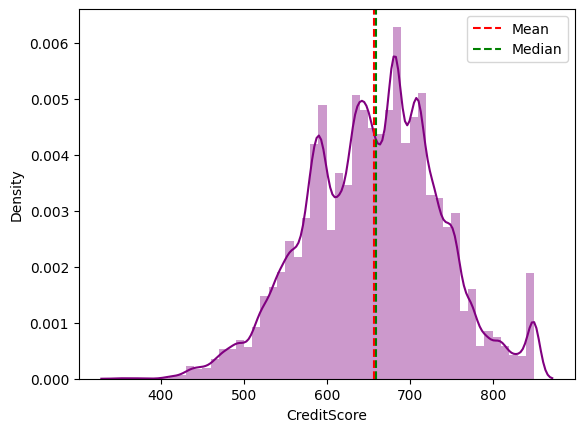

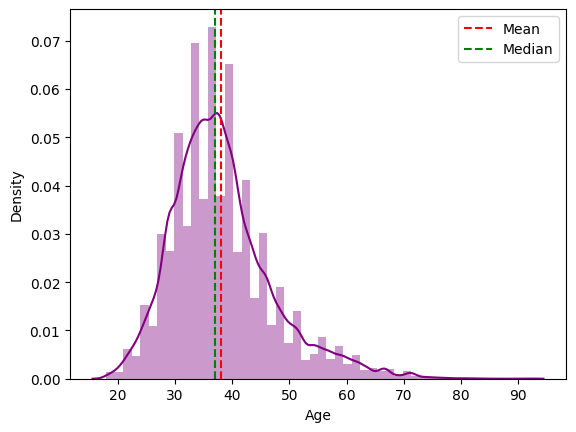

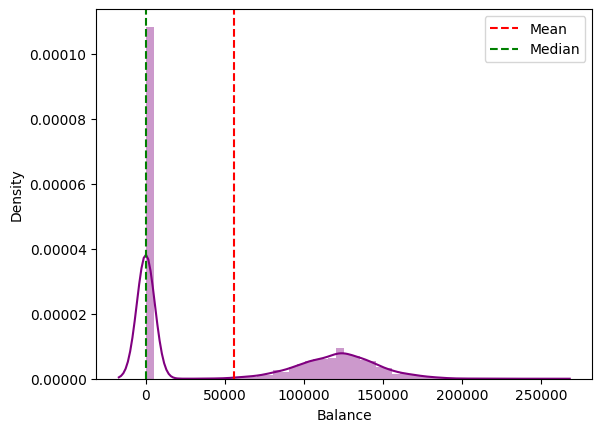

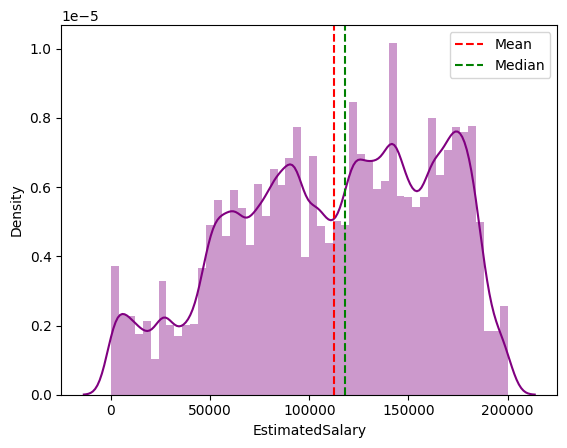

In [58]:
# distplot of Numeric columns
for col in num_cols:
    sns.distplot(df[col], kde=True, color='purple')
    # lets add the Mean and Median line in each plot
    plt.axvline(df[col].mean(), color='r', linestyle='--', label='Mean')
    plt.axvline(df[col].median(), color='g', linestyle='--', label='Median')
    plt.legend()
    plt.show()


### **Step-11| Scaling** <a id="Step-12"></a>

In [59]:
scalar=StandardScaler()
df[num_cols]=scalar.fit_transform(df[num_cols])

### **Step-12| Transformation** <a id="Step-12"></a>

In [60]:
from sklearn.preprocessing import QuantileTransformer
from sklearn.preprocessing import PowerTransformer
pt_boxcox=PowerTransformer(standardize=True)
df[num_cols]=pt_boxcox.fit_transform(df[num_cols])
pt_yeojohnson=PowerTransformer(standardize=True)
df[num_cols]=pt_yeojohnson.fit_transform(df[num_cols])
qt_normal=QuantileTransformer(output_distribution='normal', random_state=42)
df[num_cols]=qt_normal.fit_transform(df[num_cols])

### **Step-13| Encoding** <a id="Step-13"></a>

In [61]:
le=LabelEncoder()
df['Gender']=le.fit_transform(df['Gender'])
df['Geography']=le.fit_transform(df['Geography'])
df['binned_Age']=le.fit_transform(df['binned_Age'])

In [62]:
df.head()

,id,CustomerId,Surname,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,Exited,binned_Age
0,0,15674932,Okwudilichukwu,0.116941,0,1,-0.556927,3,-5.199338,2,1.0,0.0,1.555273,0,0
1,1,15749177,Okwudiliolisa,-0.384375,0,1,-0.556927,1,-5.199338,2,1.0,1.0,-1.181096,0,0
2,2,15694510,Hsueh,0.212353,0,1,0.391137,10,-5.199338,2,1.0,0.0,1.762231,0,0
3,3,15741417,Kao,-0.901416,0,1,-0.414267,2,1.606171,1,1.0,1.0,-0.503657,0,0
4,4,15766172,Chiemenam,0.798769,2,1,-0.556927,5,-5.199338,2,1.0,1.0,-1.767466,0,0


<a id="Step-14"></a>
<span style="font-weight: bold; color: Red; font-size: 35px;">Step-14| Deep Learning (Neural Network)</span>

In [63]:
# Select the Features and labels
X=df.drop(['Exited', 'id', 'CustomerId', 'Surname'], axis=1)
y=df['Exited']

In [64]:
X.head()

,CreditScore,Geography,Gender,Age,Tenure,Balance,NumOfProducts,HasCrCard,IsActiveMember,EstimatedSalary,binned_Age
0,0.116941,0,1,-0.556927,3,-5.199338,2,1.0,0.0,1.555273,0
1,-0.384375,0,1,-0.556927,1,-5.199338,2,1.0,1.0,-1.181096,0
2,0.212353,0,1,0.391137,10,-5.199338,2,1.0,0.0,1.762231,0
3,-0.901416,0,1,-0.414267,2,1.606171,1,1.0,1.0,-0.503657,0
4,0.798769,2,1,-0.556927,5,-5.199338,2,1.0,1.0,-1.767466,0


Epoch 1/100
4126/4126 [==============================] - 17s 4ms/step - loss: 0.3739 - accuracy: 0.8391 - val_loss: 0.3409 - val_accuracy: 0.8542
Epoch 2/100
4126/4126 [==============================] - 9s 2ms/step - loss: 0.3338 - accuracy: 0.8597 - val_loss: 0.3306 - val_accuracy: 0.8598
Epoch 3/100
4126/4126 [==============================] - 11s 3ms/step - loss: 0.3289 - accuracy: 0.8621 - val_loss: 0.3260 - val_accuracy: 0.8618
Epoch 4/100
4126/4126 [==============================] - 9s 2ms/step - loss: 0.3277 - accuracy: 0.8624 - val_loss: 0.3257 - val_accuracy: 0.8640
Epoch 5/100
4126/4126 [==============================] - 9s 2ms/step - loss: 0.3261 - accuracy: 0.8628 - val_loss: 0.3247 - val_accuracy: 0.8618
Epoch 6/100
4126/4126 [==============================] - 9s 2ms/step - loss: 0.3256 - accuracy: 0.8632 - val_loss: 0.3246 - val_accuracy: 0.8640
Epoch 7/100
4126/4126 [==============================] - 9s 2ms/step - loss: 0.3251 - accuracy: 0.8634 - val_loss: 0.3238 - val_

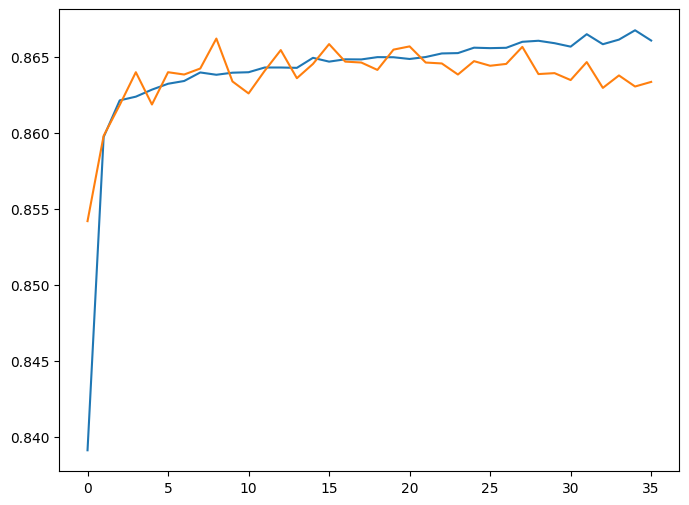

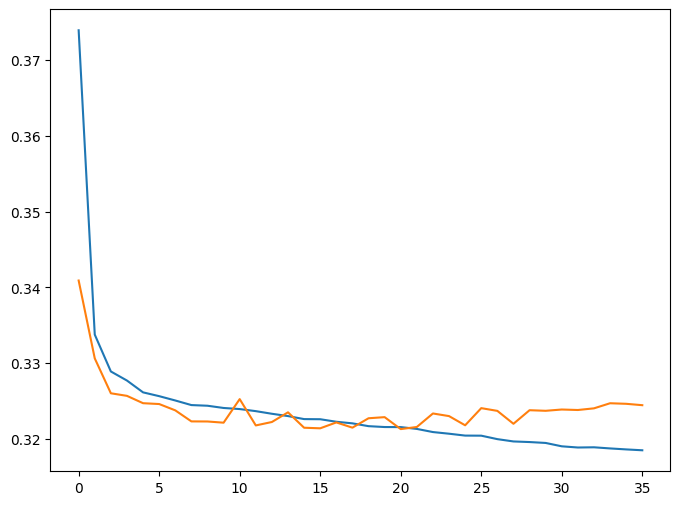

In [65]:
# split the data into training and testing set
X_train,X_test,y_train,y_test=train_test_split(X,y, test_size=0.2, random_state=42)
# Create a Deep Network Model
model=tf.keras.models.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=[X_train.shape[1]]),
    tf.keras.layers.Dense(32, activation='relu'),
    tf.keras.layers.Dense(16, activation='relu'),
    tf.keras.layers.Dense(8, activation='relu'),
    tf.keras.layers.Dense(1, activation='sigmoid')
])
# Apply the call back function or Early stopping
early_stopping=EarlyStopping(patience=15)
# compile the model
model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy'])
# # plot the training and testing loss for each epoch
history = model.fit(X_train, y_train, epochs=100, batch_size=32, verbose=1, validation_data=(X_test, y_test), callbacks=[early_stopping])
# plot the accuracy and validation accuracy
fig,ax=plt.subplots(figsize=(8,6))
ax.plot(history.history['accuracy'], label='Training accuracy')
ax.plot(history.history['val_accuracy'], label='Validation accuracy')
plt.show()
# plot the Training and Validation loss
fig,ax=plt.subplots(figsize=(8,6))
ax.plot(history.history['loss'], label='Training Loss')
ax.plot(history.history['val_loss'], label='Validation Loss')
plt.show()

<a id="Step-15"></a>
<span style="font-weight: bold; color: Red; font-size: 35px;">Step-15| XGBClassifier</span>

Best parameters: {'learning_rate': 0.1, 'max_depth': 3, 'n_estimators': 300}
Best score: 0.865269982655063
Accuracy: 0.8685127397218771
accuracy: 0.8685127397218771
precision_score: 0.8685127397218771
recall_score: 0.8685127397218771
f1_score: 0.868512739721877
classification_report:
               precision    recall  f1-score   support

           0       0.89      0.95      0.92     26052
           1       0.75      0.56      0.64      6955

    accuracy                           0.87     33007
   macro avg       0.82      0.75      0.78     33007
weighted avg       0.86      0.87      0.86     33007

confusion_matrix:
 [[24791  1261]
 [ 3079  3876]]


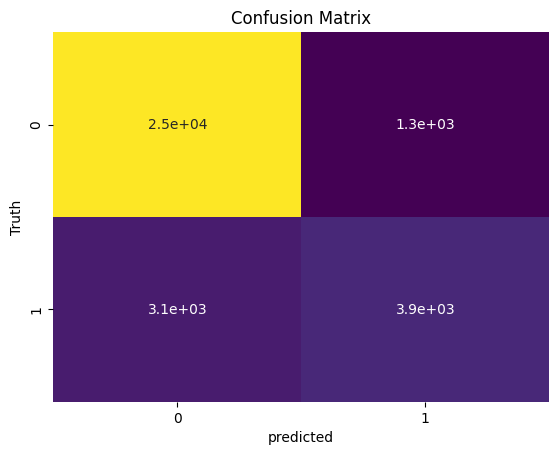

In [66]:
from xgboost import XGBClassifier
# Call the Model
xgb=XGBClassifier()
# Train the model
xgb.fit(X_train,y_train)
# predict the model
y_pred = xgb.predict(X_test)
from sklearn.model_selection import GridSearchCV

# Define the parameter grid
param_grid = {
    'n_estimators': [100, 200, 300],
    'max_depth': [3, 4, 5],
    'learning_rate': [0.1, 0.01, 0.001]
}

# Create a grid search object
grid_search = GridSearchCV(estimator=XGBClassifier(), param_grid=param_grid, cv=3)

# Fit the grid search to the training data
grid_search.fit(X_train, y_train)

# Get the best parameters and best score
best_params = grid_search.best_params_
best_score = grid_search.best_score_

# Create a new XGBoost classifier with the best parameters
xgb = XGBClassifier(**best_params)

# Train the model with the updated hyperparameters
xgb.fit(X_train, y_train)

# Predict and evaluate the model
y_pred = xgb.predict(X_test)
accuracy = accuracy_score(y_test, y_pred)
print('Best parameters:', best_params)
print('Best score:', best_score)
print('Accuracy:', accuracy)
# Evaluate the model
print('accuracy:', accuracy_score(y_test, y_pred))
print('precision_score:', precision_score(y_test, y_pred, average='micro'))
print('recall_score:', recall_score(y_test, y_pred, average='micro'))
print('f1_score:', f1_score(y_test, y_pred, average='micro'))
print('classification_report:\n', classification_report(y_test, y_pred))
print('confusion_matrix:\n', confusion_matrix(y_test, y_pred))
# Calculate confusion matrix
cm = confusion_matrix(y_test, y_pred)
# Plot the confusion matrix
sns.heatmap(cm, annot=True, cbar=False, cmap='viridis')
plt.title('Confusion Matrix')
plt.xlabel('predicted')
plt.ylabel('Truth')
plt.show()


In [67]:
# from sklearn.model_selection import GridSearchCV

# # Define the parameter grid
# param_grid = {
#     'n_estimators': [100, 200, 300],
#     'max_depth': [3, 4, 5],
#     'learning_rate': [0.1, 0.01, 0.001]
# }

# # Create a grid search object
# grid_search = GridSearchCV(estimator=XGBClassifier(), param_grid=param_grid, cv=3)

# # Fit the grid search to the training data
# grid_search.fit(X_train, y_train)

# # Get the best parameters and best score
# best_params = grid_search.best_params_
# best_score = grid_search.best_score_

# # Create a new XGBoost classifier with the best parameters
# xgb = XGBClassifier(**best_params)

# # Train the model with the updated hyperparameters
# xgb.fit(X_train, y_train)

# # Predict and evaluate the model
# y_pred = xgb.predict(X_test)
# accuracy = accuracy_score(y_test, y_pred)
# print('Best parameters:', best_params)
# print('Best score:', best_score)
# print('Accuracy:', accuracy)

### **Step-16| Creating Submission File**


In [68]:
from sklearn.preprocessing import LabelEncoder

# Apply binning to Age column in the test dataset
df_test['binned_Age'] = pd.cut(df_test['Age'], bins=[18, 40, 60, 75, 90],
labels=['Adult', 'Middle_aged', 'older', 'oldest'])

# Convert categorical columns to numerical values
le = LabelEncoder()
df_test['Geography'] = le.fit_transform(df_test['Geography'])
df_test['Gender'] = le.fit_transform(df_test['Gender'])

# Drop unnecessary columns from the test dataset
df_test.drop(['id', 'CustomerId', 'Surname'], axis=1, inplace=True)

# Predict the test data and create a submission file of probability of each class
y_pred = xgb.predict_proba(df_test)
submission['Exited'] = y_pred[:, 1]
submission.to_csv('submission_bank_churn2.csv', index=False)

<a id="Step-17"></a>
<span style="font-weight: bold; color: Red; font-size: 35px;">Step-17| HyperparameterTuning of XGBClassifier</span>

In [69]:
# call the models
models = {
    'Logistic Regression': (LogisticRegression(random_state=42), {}),
    'KNN': (KNeighborsClassifier(), {'model__n_neighbors': [10, 30]}),
    'SVC': (SVC(random_state=42), {'model__gamma': ['scale', 'auto']}),
    'DecisionTreeClassifier': (DecisionTreeClassifier(random_state=42), {'model__max_depth': [5, 10, 15]}),
    'RandomForestClassifier': (RandomForestClassifier(random_state=42), {'model__n_estimators': [100, 200, 300], 'model__max_depth': [5, 10, 15]}),
    'GradientBoostingClassifier': (GradientBoostingClassifier(random_state=42), {'model__learning_rate': [0.1, 0.01, 0.001]}),
    'AdaBoostClassifier': (AdaBoostClassifier(random_state=42), {'model__n_estimators': [50, 100, 200]}),
    'XGBClassifier': (XGBClassifier(random_state=42), {'model__max_depth': [3, 4, 5]}),
    'Naive Bayes': (GaussianNB(), {})
}
best_model=None
best_accuracy=0
for name,(models,params) in models.items():
    pipeline=Pipeline(steps=[
        ('model',models)
])
    # Apply the cross validation score
    scores=cross_val_score(pipeline, X_train, y_train,cv=5, verbose=0)
    # mean_accuracy
    mean_accuracy=scores.mean()
    # predict the pipeline
    pipeline.fit(X_train,y_train)
    # Train the pipeline
    y_pred=pipeline.predict(X_test)
    accuracy=accuracy_score(y_test,y_pred)
    # print the evaluation metrics
    print('Model', name)
    print('Cross_validation accuracy', mean_accuracy)
    print('accuracy', accuracy)
    print('\n')


    # Evaluate the model
    if accuracy > best_accuracy:
       best_accuracy = accuracy
       best_model = pipeline
# print the best model
print("Best Model is:", best_model)

# Save the best model
# import pickle
# pickle.dump(best_model, open('./sample_submission.csv1/sumission_bank_churn_data.csv'))

Model Logistic Regression
Cross_validation accuracy 0.8287093037719604
accuracy 0.8278546974884116


Model KNN
Cross_validation accuracy 0.8380483003789614
accuracy 0.8399127457811979


Model SVC
Cross_validation accuracy 0.8471979389098404
accuracy 0.8479716423788893


Model DecisionTreeClassifier
Cross_validation accuracy 0.7944966166603871
accuracy 0.7955888144938952


Model RandomForestClassifier
Cross_validation accuracy 0.8578397030174653
accuracy 0.8579998182203775


Model GradientBoostingClassifier
Cross_validation accuracy 0.8636567065293885
accuracy 0.8655436725543066


Model AdaBoostClassifier
Cross_validation accuracy 0.8599529141918205
accuracy 0.8628169782167419


Model XGBClassifier
Cross_validation accuracy 0.8636415461228184
accuracy 0.8651498167055474


Model Naive Bayes
Cross_validation accuracy 0.8218925105575051
accuracy 0.8201593601357288


Best Model is: Pipeline(steps=[('model', GradientBoostingClassifier(random_state=42))])


In [70]:
from sklearn.ensemble import GradientBoostingClassifier

# Assuming you have your training data in X_train and corresponding labels in y_train

# Initialize the Gradient Boosting Classifier
model = GradientBoostingClassifier()

# Train the model
model.fit(X_train, y_train)

GradientBoostingClassifier()


### **Step-18| Creating Submission File**

In [71]:
from sklearn.preprocessing import LabelEncoder

# Apply binning to Age column in the test dataset
df_test['binned_Age'] = pd.cut(df_test['Age'], bins=[18, 40, 60, 75, 90],
labels=['Adult', 'Middle_aged', 'older', 'oldest'])

# Convert categorical columns to numerical values
le = LabelEncoder()
df_test['Geography'] = le.fit_transform(df_test['Geography'])
df_test['Gender'] = le.fit_transform(df_test['Gender'])

# Predict the test data and create a submission file of probability of each class
y_pred = xgb.predict_proba(df_test)
submission['Exited'] = y_pred[:, 1]
submission.to_csv('submission_bank_churn.csv', index=False)
